In [9]:
#1,11,22,32,43,53,56,66,74,77

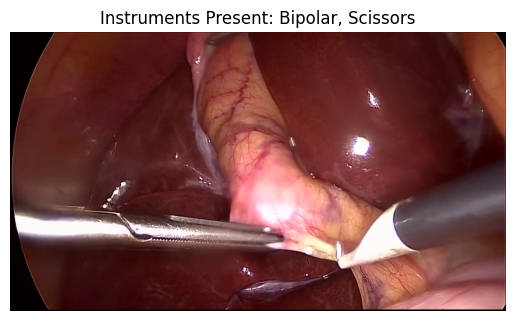

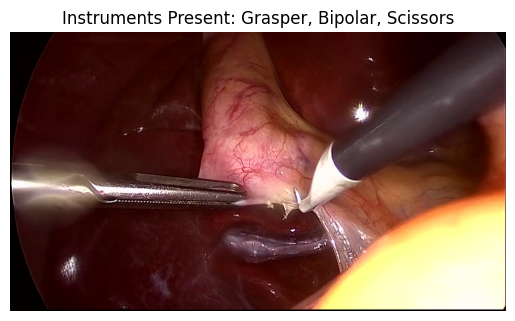

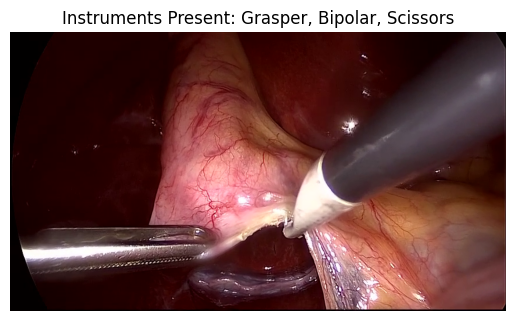

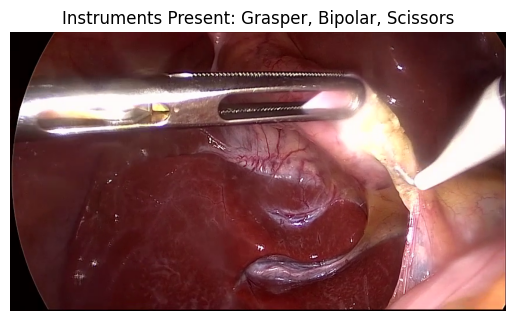

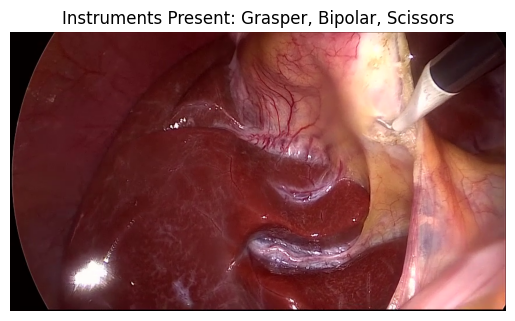

...

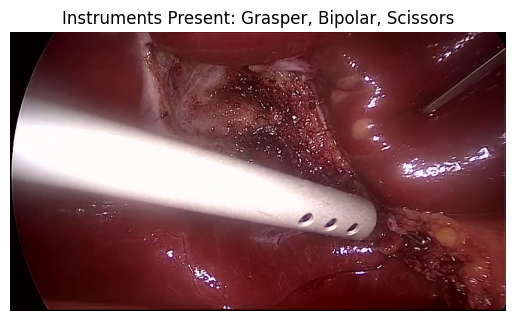

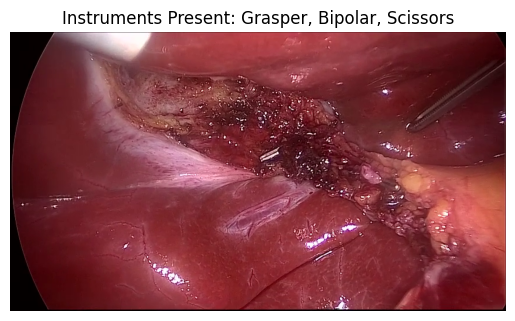

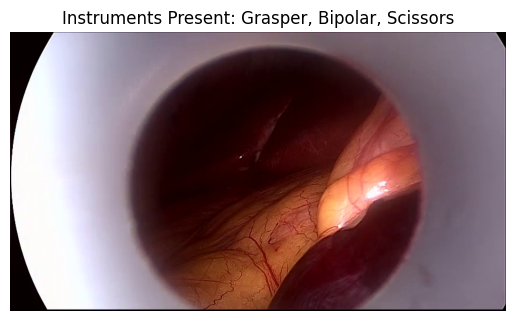

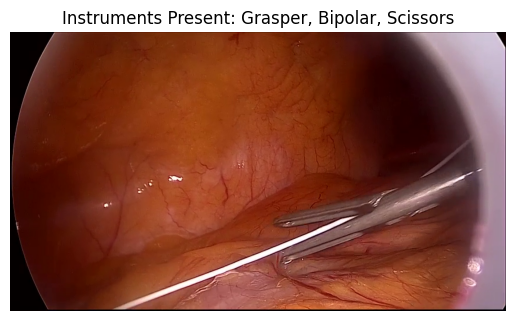

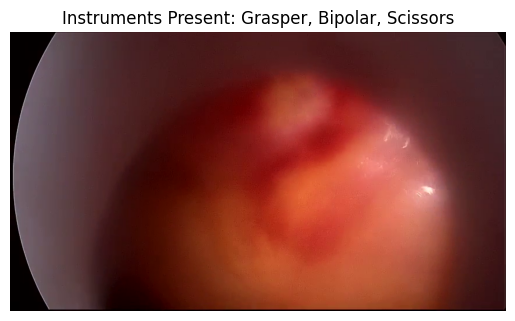

In [10]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define the directory paths
frames_directory = "frames"

# Define the video ID you want to analyze
video_id = 22 # Replace with the desired video ID

# Define the list of instruments
INSTRUMENTS = [
    "Grasper",
    "Bipolar",
    "Hook",
    "Scissors",
    "Clipper",
    "Irrigator",
    "SpecimenBag"
]

# Function to display frames with instrument presence
def display_frames_with_instruments(frames, instruments_presence):
    for frame, instruments in zip(frames, instruments_presence):
        plt.figure()
        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        instrument_string = ", ".join([INSTRUMENTS[i] for i, presence in enumerate(instruments) if presence])
        plt.title(f"Instruments Present: {instrument_string}")
        plt.axis("off")
        plt.show()

# Load frames for the video
frames = []
frames_directory_video = os.path.join(frames_directory, f"video{video_id}")
frame_files = sorted(os.listdir(frames_directory_video))
for frame_file in frame_files:
    frame_path = os.path.join(frames_directory_video, frame_file)
    frame = cv2.imread(frame_path)
    frames.append(frame)

# Define the file name for instrument presence data
instrument_data_file = f"video{video_id}-tool.txt"

# Load instrument presence information for the video, skipping the header
instrument_file_path = os.path.join("tool_annotations", instrument_data_file)
with open(instrument_file_path, "r") as instrument_file:
    # Skip the header or labels (e.g., "Frame")
    next(instrument_file)
    instrument_lines = instrument_file.read().splitlines()

# Convert instrument presence lines to binary arrays
instruments_presence = []
for line in instrument_lines:
    instrument_data = line.split()
    instrument_presence = [int(val) for val in instrument_data]
    instruments_presence.append(instrument_presence)

# Display frames with instrument presence
display_frames_with_instruments(frames, instruments_presence)


In [11]:
import tensorflow as tf
from keras.applications import VGG16
from keras.layers import Input, Flatten, Dense, LSTM
from keras.models import Model

# Load the pre-trained VGG-16 model without the top (classification) layer
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

In [12]:
#Feature fusion

from keras.layers import concatenate, Input, Conv2D, MaxPooling2D, Flatten, Dense
from keras.layers import Conv2D, MaxPooling2D

# Define the additional input shape (adjust as needed)
additional_input = Input(shape=(224, 224, 1)) # Define the input shape for your additional data

# Define layers for processing the additional data
x = Conv2D(64, (3, 3), activation='relu')(additional_input)
x = MaxPooling2D((2, 2))(x)
x = Conv2D(128, (3, 3), activation='relu')(x)
x = MaxPooling2D((2, 2))(x)
x = Flatten()(x)
x = Dense(64, activation='relu')(x)

# This will be the output of your additional branch
additional_features = x



In [13]:

# Freeze the layers of the pre-trained model
for layer in base_model.layers:
    layer.trainable = False

# Create a custom head for instrument presence detection
x = Flatten()(base_model.output)
x = Dense(128, activation='relu')(x)
x = Dense(64, activation='relu')(x)

# Create a Lambda layer to expand dimensions and make it compatible with LSTM
from keras.layers import Lambda
expand_dim = Lambda(lambda x: tf.expand_dims(x, axis=1))(x)

# Add an LSTM layer (adjust the parameters as needed)
lstm_units = 64  # You can change the number of LSTM units as per your requirements
lstm_layer = LSTM(units=lstm_units)(expand_dim)

# Modify the output layer for multi-class classification
num_classes = 7  # Number of instrument classes
output = Dense(num_classes, activation='softmax')(lstm_layer)  # Softmax for multi-class classification
# Example output layer for binary classification with 7 classes


In [14]:

# Create the custom model
model = Model(inputs=base_model.input, outputs=output)

from keras.optimizers import Adam

model.compile(
    loss='categorical_crossentropy',  # Use categorical cross-entropy for multi-class classification
    optimizer=Adam(lr=0.0001),  # Adjust learning rate as needed
    metrics=['accuracy']
)

c:\Users\96659\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\optimizers\legacy\adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [15]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Define the directory paths
frames_directory = "frames"

# Define the specific video IDs you want to analyze
video_ids_to_analyze = [22]

# Define the list of instruments


# Function to load frames and generate instrument presence labels for specific video IDs
def load_frames_and_labels(frames_directory, video_ids):
    frames_data = []
    instrument_presence_labels = []

    for video_id in video_ids:
        video_name = f"video{video_id:02d}"
        video_directory = os.path.join(frames_directory, video_name)

        # Load frames for the video
        frame_files = sorted(os.listdir(video_directory))
        frames = []
        for frame_file in frame_files:
            frame_path = os.path.join(video_directory, frame_file)
            frame = cv2.imread(frame_path)

            # Check if the frame was successfully loaded
            if frame is not None:
                frame = cv2.resize(frame, (224, 224))  # Resize to match VGG-16 input size
                frame = (frame * 255).astype(np.uint8)  # Ensure the correct data type
                frames.append(frame)
            else:
                print(f"Failed to load: {frame_path}")

        # Load instrument presence labels (skip header lines)
        instrument_data_file = f"{video_name}-tool.txt"
        instrument_file_path = os.path.join("tool_annotations", instrument_data_file)
        with open(instrument_file_path, "r") as instrument_file:
            instrument_lines = instrument_file.read().splitlines()

        # Skip header lines (if present)
        instrument_lines = [line for line in instrument_lines if not line.startswith("Frame")]

        instruments_presence = []
        for line in instrument_lines:
            instrument_data = line.split()
            instrument_presence = [int(val) for val in instrument_data]
            instruments_presence.append(instrument_presence)

        # Append frames and labels to the lists
        frames_data.extend(frames)
        instrument_presence_labels.extend(instruments_presence)

    return np.array(frames_data), np.array(instrument_presence_labels)

# Load frames and instrument presence labels for specific video IDs
frames_data, instrument_presence_labels = load_frames_and_labels(frames_directory, video_ids_to_analyze)




In [16]:
# Define the number of epochs and batch size for training
num_epochs = 10  # Adjust the number of epochs as needed
batch_size = 32  # Adjust the batch size as needed

# Define a callback to save the best model during training
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(
    "best_model.h5",
    save_best_only=True,
    monitor="val_loss",
    mode="min",
    verbose=1
)

# Define the data generator to augment and preprocess training data
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    horizontal_flip=True,  # Augmentation: horizontal flip
    rotation_range=20,     # Augmentation: random rotation
    width_shift_range=0.2, # Augmentation: random width shift
    height_shift_range=0.2 # Augmentation: random height shift
)

# Apply the same transformations to both images and masks
def create_generator(generator, frames, labels):
    image_gen = generator.flow(frames, labels, batch_size=batch_size, shuffle=True)
    while True:
        x, y = image_gen.next()
        yield x, y

# Drop the 'Frame' column (first column) to keep only the instrument columns
instrument_presence_labels = instrument_presence_labels[:, 1:]

# Split the data into training and validation sets
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(frames_data, instrument_presence_labels, test_size=0.2, random_state=42)

# Create data generators for training and validation
train_generator = create_generator(train_datagen, X_train, y_train)
val_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)
val_generator = create_generator(val_datagen, X_val, y_val)


In [17]:
#LOSS FUNCTION
# Compile the model
model.compile(
    loss='binary_crossentropy',
    optimizer=Adam(lr=0.0001),  # Adjust learning rate as needed
    metrics=['accuracy']
)

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=len(X_train) // batch_size,
    epochs=num_epochs,
    validation_data=val_generator,
    validation_steps=len(X_val) // batch_size,
    callbacks=[model_checkpoint]
)

# Save the final model
model.save("final_model.h5")


c:\Users\96659\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\optimizers\legacy\adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Epoch 1/10
1/1 [==============================] - 7s 7s/step - loss: 0.6894 - accuracy: 0.4062
Epoch 2/10
1/1 [==============================] - 2s 2s/step - loss: 0.6436 - accuracy: 1.0000
Epoch 3/10
1/1 [==============================] - 4s 4s/step - loss: 0.6129 - accuracy: 1.0000
Epoch 4/10
1/1 [==============================] - 2s 2s/step - loss: 0.5818 - accuracy: 1.0000
Epoch 5/10
1/1 [==============================] - 4s 4s/step - loss: 0.5581 - accuracy: 1.0000
Epoch 6/10
1/1 [==============================] - 2s 2s/step - loss: 0.5350 - accuracy: 1.0000
Epoch 7/10
1/1 [==============================] - 4s 4s/step - loss: 0.5176 - accuracy: 1.0000
Epoch 8/10
1/1 [==============================] - 2s 2s/step - loss: 0.5018 - accuracy: 1.0000
Epoch 9/10
1/1 [==============================] - 4s 4s/step - loss: 0.4828 - accuracy: 1.0000
Epoch 10/10
1/1 [==============================] - 2s 2s/step - loss: 0.4690 - accuracy: 1.0000


In [18]:
from keras.models import load_model
model = load_model("final_model.h5")


import os
import cv2
import numpy as np

# Define the directory path for the test folder containing subfolders (test_video01, test_video02, etc.)
test_frames_directory = "test"

# Function to load and preprocess frames from subfolders
def load_and_preprocess_frames_from_test_subfolders(test_parent_directory):
    test_frames_data = []
    test_image_paths = []  # Store image paths for annotations

    # List subfolders (test_video01, test_video02, etc.) inside the test parent directory
    test_subfolders = [folder for folder in os.listdir(test_parent_directory) if os.path.isdir(os.path.join(test_parent_directory, folder))]

    for test_subfolder in test_subfolders:
        test_subfolder_path = os.path.join(test_parent_directory, test_subfolder)

        # List image files within each test subfolder
        test_image_files = [file for file in os.listdir(test_subfolder_path) if file.lower().endswith(('.jpg', '.jpeg', '.png'))]

        for test_image_file in test_image_files:
            test_image_path = os.path.join(test_subfolder_path, test_image_file)
            test_frame = cv2.imread(test_image_path)

            # Check if the frame was successfully loaded
            if test_frame is not None:
                test_frame = cv2.resize(test_frame, (224, 224))  # Resize to match VGG-16 input size
                test_frame = test_frame / 255.0  # Normalize pixel values to [0, 1]
                test_frames_data.append(test_frame)
                test_image_paths.append(test_image_path)  # Store image path for annotations
            else:
                print(f"Failed to load: {test_image_path}")

    return np.array(test_frames_data), test_image_paths

# Load and preprocess frames from the test folder
test_frames_data, test_image_paths = load_and_preprocess_frames_from_test_subfolders(test_frames_directory)


In [24]:
# Perform inference with the trained model on the test frames
test_predictions = model.predict(test_frames_data)

# Define a threshold to determine instrument presence
threshold = 0.26 # Adjust the threshold as needed

# Create a list to store the predictions for each test video
test_video_predictions = []

# Iterate through test frames and annotate with instrument names
for test_frame, test_image_path in zip(test_predictions, test_image_paths):
    instrument_names = [INSTRUMENTS[i] for i, presence in enumerate(test_frame) if presence > threshold]
    instrument_text = ', '.join(instrument_names)
    
    # Store the predictions for each test video
    test_video_predictions.append((test_image_path, instrument_text))

# Display or save the predictions as needed
for test_image_path, instrument_text in test_video_predictions:
    print(f"Image: {test_image_path}")
    print(f"Instruments: {instrument_text}\n")


3/3 [==============================] - 13s 4s/step
Image: test\video77\video77_000005.png
Instruments: Grasper

Image: test\video77\video77_000022.png
Instruments: Grasper

Image: test\video77\video77_000058.png
Instruments: Grasper

Image: test\video77\video77_000073.png
Instruments: Grasper

Image: test\video77\video77_000090.png
Instruments: Grasper

Image: test\video77\video77_000100.png
Instruments: Grasper

Image: test\video77\video77_000134.png
Instruments: Grasper

Image: test\video77\video77_000151.png
Instruments: Grasper

Image: test\video77\video77_000212.png
Instruments: Grasper

Image: test\video77\video77_000246.png
Instruments: Grasper

Image: test\video77\video77_000263.png
Instruments: Grasper

Image: test\video77\video77_000280.png
Instruments: Grasper

Image: test\video77\video77_000307.png
Instruments: Grasper

Image: test\video77\video77_000324.png
Instruments: Grasper, Hook

Image: test\video77\video77_000341.png
Instruments: Grasper

Image: test\video77\video77_